# Meme Filter AI

In [1]:
# @title Get memes
import os
import requests

# Create directory
save_dir = "content/memes"
os.makedirs(save_dir, exist_ok=True)


# The Current API only provides Memes with No text
# this makes the model under perform.
# Give memes with text to fully Utizie it.

In [2]:
import requests
import os
import re

def download_meme_images():
    """
    Fetches memes from the Imgflip API and downloads the actual image files
    into a dedicated folder in Google Colab.
    """
    # 1. Create memes DIR
    folder_name = "content/memes"
    if not os.path.exists(folder_name):
        os.makedirs(folder_name)
        print(f"Created directory: /{folder_name}/")

    # 2. Fetch the memes from API
    try:
        api_url = "https://api.imgflip.com/get_memes"
        response = requests.get(api_url)
        response.raise_for_status()  # Raise an HTTPError for bad responses (4xx or 5xx)
        data = response.json()

        if not data["success"]:
            print("Failed to fetch memes: API call was not successful.")
            return

        memes_list = data["data"]["memes"]
        print(f"Found {len(memes_list)} memes. Starting download...")

        # 3. Loop through each meme, download, and save it
        for meme in memes_list:
            meme_url = meme["url"]
            meme_name = meme["name"]

            # Sanitize the meme name to create a valid filename
            # Removes special characters and replaces spaces with underscores
            file_extension = meme_url.split('.')[-1]
            safe_filename = re.sub(r'[^\w\s-]', '', meme_name).strip().replace(' ', '_')
            file_path = os.path.join(folder_name, f"{safe_filename}.{file_extension}")

            try:
                # Download the image
                image_response = requests.get(meme_url)
                image_response.raise_for_status()

                # Save the image to the file
                with open(file_path, 'wb') as f:
                    f.write(image_response.content)

                print(f"✅ Saved: {file_path}")

            except requests.exceptions.RequestException as e:
                print(f"❌ Failed to download {meme_name} from {meme_url}. Error: {e}")

        print("\n🎉 Download complete! Check the 'meme_images' folder.")

    except requests.exceptions.RequestException as e:
        print(f"❌ An error occurred while contacting the API: {e}")
    except (KeyError, TypeError):
        print("❌ Could not parse the API response correctly.")


# Run the function to download the images
download_meme_images()

Found 100 memes. Starting download...
✅ Saved: content/memes/Drake_Hotline_Bling.jpg
✅ Saved: content/memes/Two_Buttons.jpg
✅ Saved: content/memes/Distracted_Boyfriend.jpg
✅ Saved: content/memes/Left_Exit_12_Off_Ramp.jpg
✅ Saved: content/memes/Running_Away_Balloon.jpg
✅ Saved: content/memes/Bernie_I_Am_Once_Again_Asking_For_Your_Support.jpg
✅ Saved: content/memes/UNO_Draw_25_Cards.jpg
✅ Saved: content/memes/Disaster_Girl.jpg
✅ Saved: content/memes/Grus_Plan.jpg
✅ Saved: content/memes/Waiting_Skeleton.jpg
✅ Saved: content/memes/Change_My_Mind.jpg
✅ Saved: content/memes/Epic_Handshake.jpg
✅ Saved: content/memes/Batman_Slapping_Robin.jpg
✅ Saved: content/memes/Sad_Pablo_Escobar.jpg
✅ Saved: content/memes/Anakin_Padme_4_Panel.png
✅ Saved: content/memes/Always_Has_Been.png
✅ Saved: content/memes/Mocking_Spongebob.jpg
✅ Saved: content/memes/Buff_Doge_vs_Cheems.png
✅ Saved: content/memes/Expanding_Brain.jpg
✅ Saved: content/memes/Woman_Yelling_At_Cat.jpg
✅ Saved: content/memes/X_X_Everywhere.

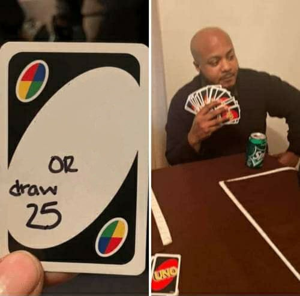

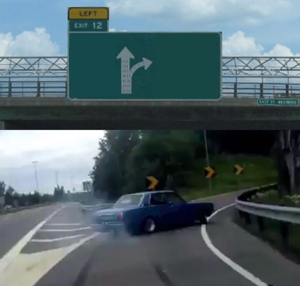

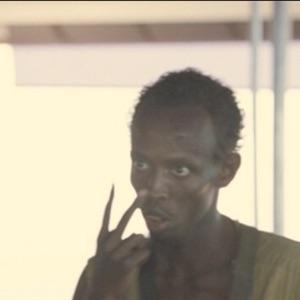

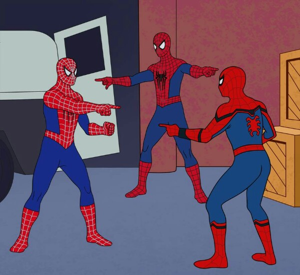

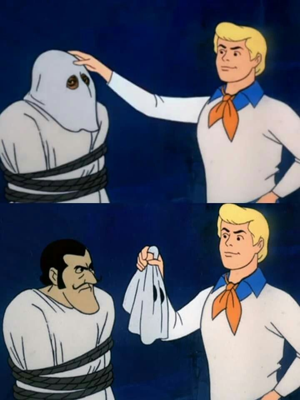

...

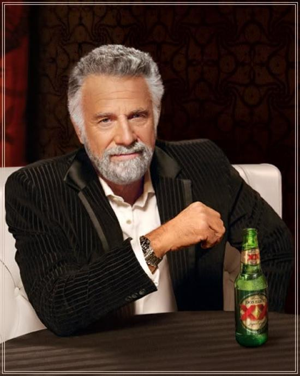

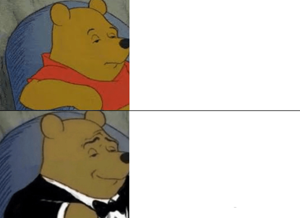

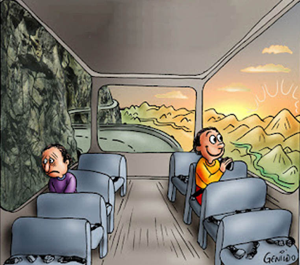

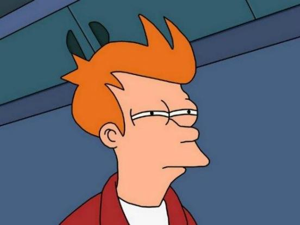

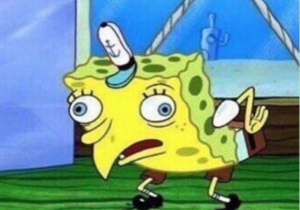

In [3]:
# @title Display All Memes
from IPython.display import display
from PIL import Image
for filename in os.listdir('content/memes'):
  if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.webp')):
    img_path = os.path.join('content/memes', filename)
    try:
      img = Image.open(img_path)
      display(img.resize((300, int(300 * img.height / img.width))))
    except Exception as e:
      print(f"Could not display image {img_path}: {e}")

In [4]:
!pip install ftfy regex tqdm git+https://github.com/openai/CLIP.git
!pip install torch torchvision pillow pytesseract
!sudo apt install tesseract-ocr

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-f36mnuli
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-f36mnuli
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [5]:
!pip install ftfy regex tqdm git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-gb4me889
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-gb4me889
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [6]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 89.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 969.6/969.6 kB 72.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.9/292.9 kB 30.4 MB/s eta 0:00:00


In [7]:

import numpy as np
import torch
import clip
from PIL import Image
import easyocr

# Initialize CLIP and EasyOCR
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
reader = easyocr.Reader(['en'])


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 142MiB/s]


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [8]:
def get_meme_paths(meme_dir="content/memes"):
    """Returns list of valid meme paths with proper extensions"""
    valid_exts = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.webp')
    return [
        os.path.join(meme_dir, f)
        for f in os.listdir(meme_dir)
        if f.lower().endswith(valid_exts)
    ]

# Usage:
meme_paths = get_meme_paths()

In [9]:
import numpy as np

def cosine_similarity(a: np.ndarray, b: np.ndarray) -> float:
    """Computes cosine similarity between two vectors"""
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

In [10]:

def extract_meme_text(img_path: str) -> str:
    """Better text extraction for memes"""
    try:
        results = reader.readtext(img_path, detail=0)
        return " ".join(results).strip() or " "
    except Exception as e:
        print(f"OCR Error: {e}")
        return " "

def clean_meme_text(text: str) -> str:
    """Standardizes meme text format"""
    import re
    text = text.upper()
    text = re.sub(r'[^A-Z0-9\s]', '', text)
    return " ".join(text.split())

def get_weighted_embedding(img_path: str, text_weight=0.7) -> np.ndarray:
    """Combines image and text embeddings intelligently"""
    text = clean_meme_text(extract_meme_text(img_path))
    img = preprocess(Image.open(img_path)).unsqueeze(0).to(device)

    with torch.no_grad():
        text_embed = model.encode_text(clip.tokenize([text]).to(device))
        img_embed = model.encode_image(img)

    return (text_weight * text_embed + (1-text_weight) * img_embed).cpu().numpy().flatten()

def search_memes(meme_paths: list, query: str, k=3, text_weight=0.7) -> list:
    """Full search pipeline"""
    # Get query embedding
    with torch.no_grad():
        query_embed = model.encode_text(clip.tokenize([query]).to(device)).cpu().numpy().flatten()

    # Compute similarities
    results = []
    for path in meme_paths:
        meme_embed = get_weighted_embedding(path, text_weight)
        sim = cosine_similarity(query_embed, meme_embed)
        results.append((path, sim))

    # Return top-k results
    return sorted(results, key=lambda x: -x[1])[:k]

# it just loves SpongeBob :3

Score: 0.814


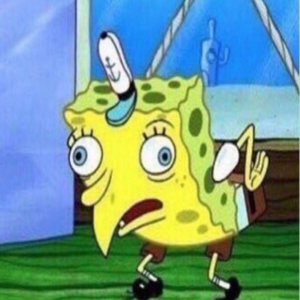

Score: 0.804


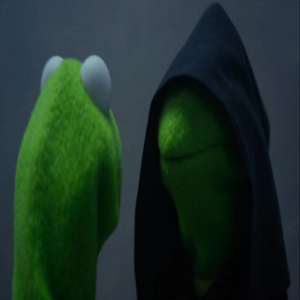

Score: 0.803


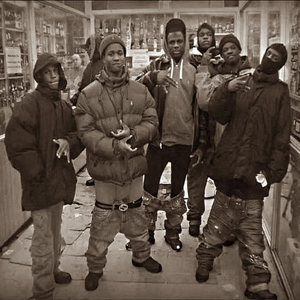

Score: 0.803


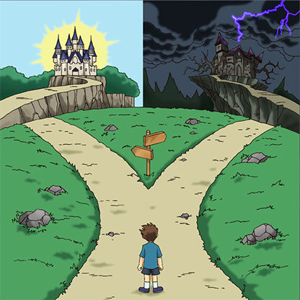

Score: 0.800


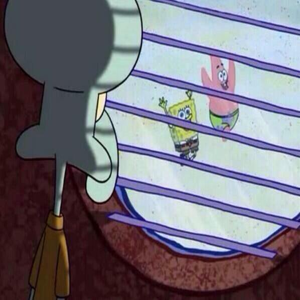

In [26]:
# 2. Perform a search
text = "Black man Chasing" # @param {"type":"string","placeholder":"girl crying"}
results = search_memes(meme_paths, text, k=5)

# 3. Display results
for path, score in results:
    print(f"Score: {score:.3f}")
    display(Image.open(path).resize((300, 300)))

# Function to Implement

# Eval uses this search Method. Another one is above.

In [24]:
def search_images(query, top_k=5):
    meme_paths = get_meme_paths()
    results = search_memes(meme_paths, query, k=top_k)
    for path, score in results:
        print(f"Score: {score:.3f}")
        display(Image.open(path).resize((300, 300)))
    top_result_path = results
    img = Image.open(top_result_path)
    display(img)
    return top_result_path

# Eval

Score: 0.831


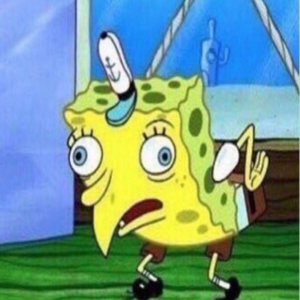

Score: 0.821


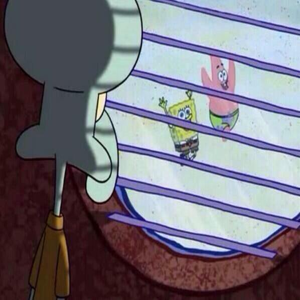

Score: 0.821


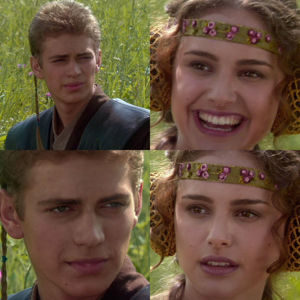

Score: 0.818


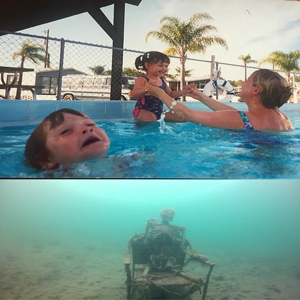

Score: 0.816


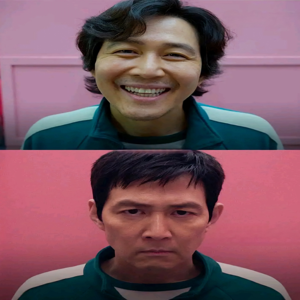

AttributeError: 'list' object has no attribute 'read'

In [25]:
# @title Search Memes
query = "girl crying" # @param {"type":"string","placeholder":"girl crying"}
results = search_images(query)
print("Search Results:", results)